# Spatial run of scCellFie

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import sccellfie

import scipy.sparse as sp

from tqdm import tqdm
from scipy import sparse

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import mpl_fontkit as fk
fk.install("Lato")
fk.set_font("Lato")

Font name: `Lato`


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
sample_idx = 1
scanpy_dir = './Figures-Peritoneal-Sample{}/'.format(sample_idx + 1)
sc.settings.figdir = scanpy_dir

## Data

### Spatial Data

In [5]:
SPOT_SIZE = 1.2

- HCA_ENDO_sp13649806 : superficial peritoneal endometriosis 
- HCA_ENDO_sp13649808 : deep infiltrating endometriosis

In [6]:
samples = ['HCA_ENDO_sp13649806', 'HCA_ENDO_sp13649808']

In [7]:
sample = samples[sample_idx]

In [8]:
adata = sc.read_visium('/nfs/team292/vl6/Endometriosis/Sanger2023/visium_lesions_magda_oxford/{}/'.format(sample),
                       count_file='raw_feature_bc_matrix.h5')
adata

AnnData object with n_obs × n_vars = 4992 × 37082
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")

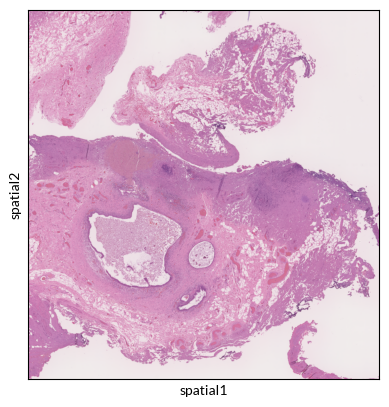

In [10]:
sc.pl.spatial(adata, img_key="hires",
              #color=cell_group, spot_size=spot_size
              cmap='YlGnBu', save='H&E')

## Preprocessing

### AnnData preprocessing

In [11]:
# Select only spots corresponding to tissue
adata = adata[adata.obs['in_tissue'] == 1.0]

In [12]:
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [13]:
# Drop spots with zero counts
adata = adata[adata.obs['total_counts'] > 0]

In [14]:
adata.layers['counts'] = adata.X.copy()

In [15]:
#adata.write_h5ad('/nfs/team292/eg22/Metabolic-Tasks/Endometrium/cell2location/viss.h5ad')

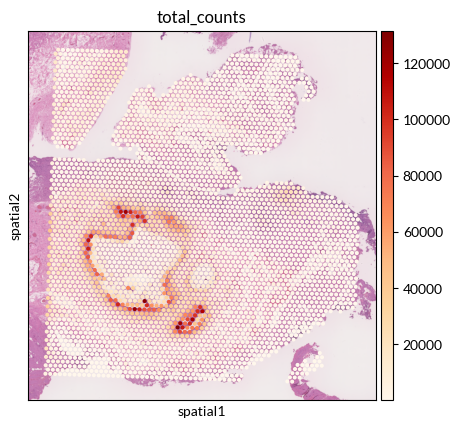

In [16]:
sc.pl.spatial(adata, 
              img_key="hires", 
              color="total_counts",
              size=SPOT_SIZE,
              use_raw=False, 
              cmap='OrRd',
              save='total_counts'
             )

In [17]:
sc.pp.filter_genes(adata, min_cells=10)

In [18]:
bdata = adata.copy()
sc.pp.normalize_total(bdata, target_sum=10000)
sc.pp.log1p(bdata)

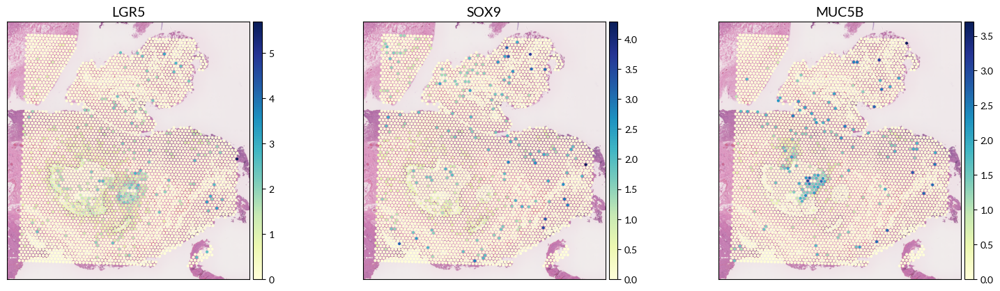

In [19]:
# Epithelial cells
markers = ['EPCAM1', 'WNT7', 'LGR5', 'SOX9', 'MUC5B']

fig, axes = sccellfie.plotting.plot_spatial(bdata,                                             
                                            keys=[g for g in markers if g in bdata.var_names],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.001,
                                            save='Epithelial-Marker-Genes',
                                           )

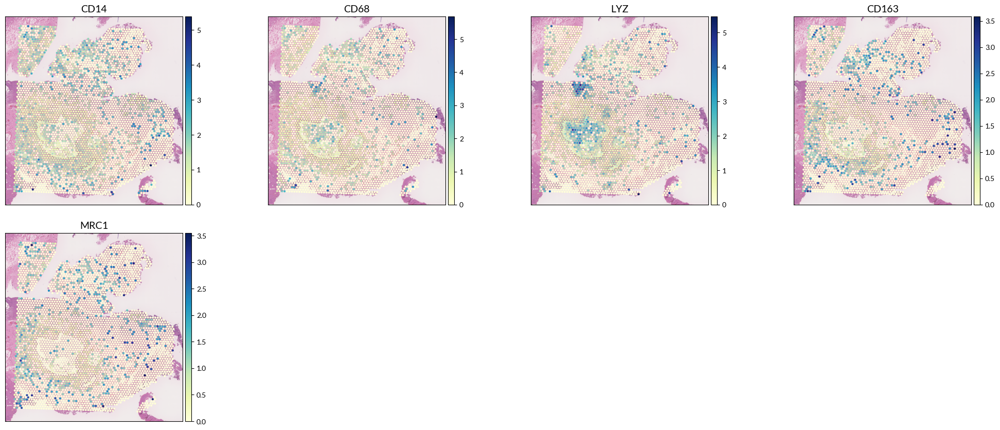

In [20]:
# Macrophages
fig, axes = sccellfie.plotting.plot_spatial(bdata,                                             
                                            keys=['CD14', 'CD68', 'LYZ', 'CD163', 'MRC1'], #'TBXA2R'],'TGFBR1', 'TGFBR2', 'IL1B', 'MSR1', 'C3', 'PLCG2', 'PLCB2'
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.001,
                                            save='Macrophage-Marker-Genes',
                                           )

In [21]:
sc.pp.highly_variable_genes(bdata, n_top_genes=2000, flavor='seurat_v3')
sc.tl.pca(bdata)
sc.pp.neighbors(bdata)
sc.tl.leiden(bdata, flavor="igraph", n_iterations=2)

2025-04-23 10:30:57.293036: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745404257.312674    1252 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745404257.319072    1252 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-23 10:30:57.347608: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


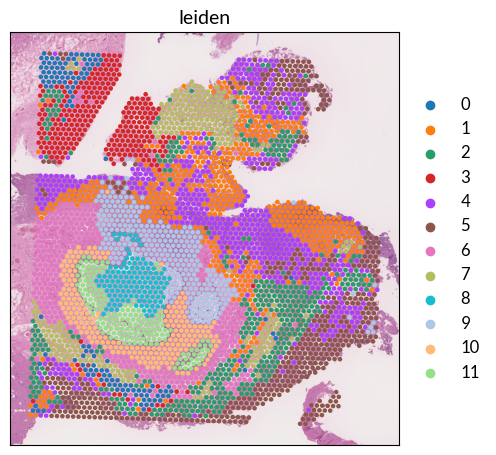

In [22]:
fig, axes = sccellfie.plotting.plot_spatial(bdata,                                             
                                            keys=['leiden'],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.001,
                                           )

## Run scCellFie

In [23]:
results = sccellfie.run_sccellfie_pipeline(adata, 
                                           organism='human',
                                           sccellfie_data_folder=None,
                                           n_counts_col='total_counts', 
                                           process_by_group=False, 
                                           groupby=None, 
                                           neighbors_key='neighbors',
                                           n_neighbors=10, 
                                           batch_key=None, 
                                           threshold_key='sccellfie_threshold', 
                                           smooth_cells=True, 
                                           alpha=0.33,
                                           chunk_size=5000,
                                           disable_pbar=False, 
                                           save_folder=None,
                                           save_filename=None
                                          )


==== scCellFie Pipeline: Initializing ====
Loading scCellFie database for organism: human

==== scCellFie Pipeline: Processing entire dataset ====

---- scCellFie Step: Preprocessing data ----

---- scCellFie Step: Computing neighbors ----

---- scCellFie Step: Preparing inputs ----
Gene names corrected to match database: 22
Shape of new adata object: (3913, 911)
Number of GPRs: 781
Shape of tasks by genes: (216, 911)
Shape of reactions by genes: (781, 911)
Shape of tasks by reactions: (216, 781)

---- scCellFie Step: Smoothing gene expression ----


Smoothing Expression: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]



---- scCellFie Step: Computing gene scores ----

---- scCellFie Step: Computing reaction activity ----


Cell Rxn Activities: 100%|██████████| 3913/3913 [00:22<00:00, 176.19it/s]



---- scCellFie Step: Computing metabolic task activity ----
Removed 1 metabolic tasks with zeros across all cells.

==== scCellFie Pipeline: Processing completed successfully ====


## Metabolic Markers

Detection using TF-IDF

In [24]:
results['adata'].metabolic_tasks.obs['leiden'] = bdata.obs['leiden']

*Run TF-IDF*

In [25]:
mrks = sccellfie.external.quick_markers(results['adata'].metabolic_tasks,
                                        cluster_key='leiden', 
                                        n_markers=20, 
                                        express_cut=5*np.log(2)
                                       )

In [26]:
mrks.head()

,gene,cluster,tf,idf,tf_idf,gene_frequency_outside_cluster,gene_frequency_global,second_best_tf,second_best_cluster,pval,qval
0,Biosynthesis of Tn_antigen (Glycoprotein N-ace...,0,0.246269,2.183015,0.537608,0.107965,0.112701,0.214286,4,7.462854e-06,2.742470e-14
1,Synthesis of phosphatidylinositol from inositol,0,0.291045,1.573792,0.458044,0.204287,0.207258,0.297101,7,1.209301e-02,7.464496e-09
2,Conversion of glutamate to glutamine,0,0.843284,0.511166,0.431058,0.591162,0.599796,0.908824,6,4.876370e-10,8.963801e-45
3,Pyridoxal-phosphate synthesis,0,0.253731,1.645342,0.417475,0.190791,0.192947,0.344203,7,4.759558e-02,5.189718e-10
4,Conversion of 1-phosphatidyl-1D-myo-inositol 4...,0,0.417910,0.950871,0.397379,0.385287,0.386404,0.480899,2,2.497729e-01,6.316703e-07


*TF-IDF filtering*

<Axes: >

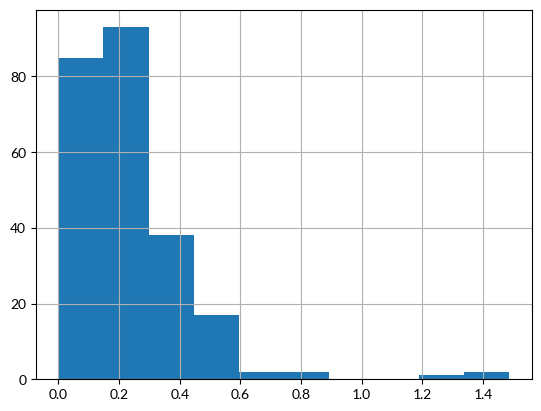

In [27]:
mrks['tf_idf'].hist()

Text(0, 0.5, 'IDF')

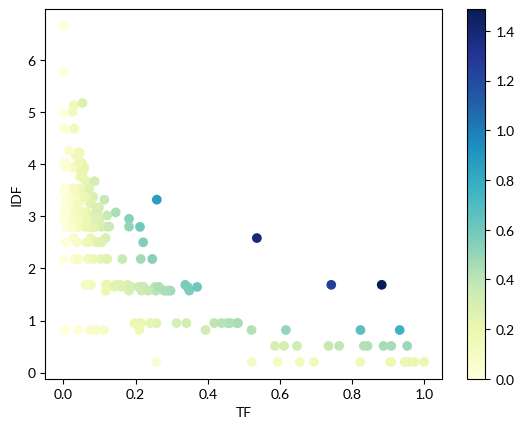

In [28]:
scatter = plt.scatter(mrks['tf'], mrks['idf'], c=mrks['tf_idf'], cmap='YlGnBu')
plt.colorbar(scatter)
plt.xlabel('TF')
plt.ylabel('IDF')

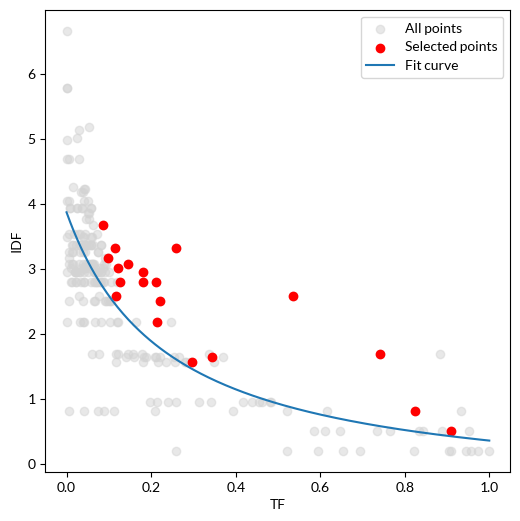

In [29]:
# Fits a hyperbolic curve and filters based on thresholds

x_col = 'tf'
y_col = 'idf'
df = mrks
tfidf_threshold = 0.3
tf_ratio = 1.2

# Visualization
plt.figure(figsize=(6, 6))

# Plot all points
plt.scatter(df[x_col], df[y_col], alpha=0.5, c='lightgray', label='All points')

# Plot selected points
filtered_mrks, curve = sccellfie.external.filter_tfidf_markers(df, tf_col=x_col, idf_col=y_col, tfidf_threshold=tfidf_threshold, tf_ratio=tf_ratio)

plt.scatter(filtered_mrks[x_col], filtered_mrks[y_col], c='red', label='Selected points')
plt.plot(*curve, label='Fit curve')

plt.xlabel('TF')
plt.ylabel('IDF')
plt.legend()

In [30]:
mrk_clusters = {0 : ['10', '11'], 1 : ['8', '11']}

In [31]:
marker_tasks = filtered_mrks.loc[(filtered_mrks.cluster.isin(mrk_clusters[sample_idx]))]['gene'].tolist()

In [32]:
len(marker_tasks)

7

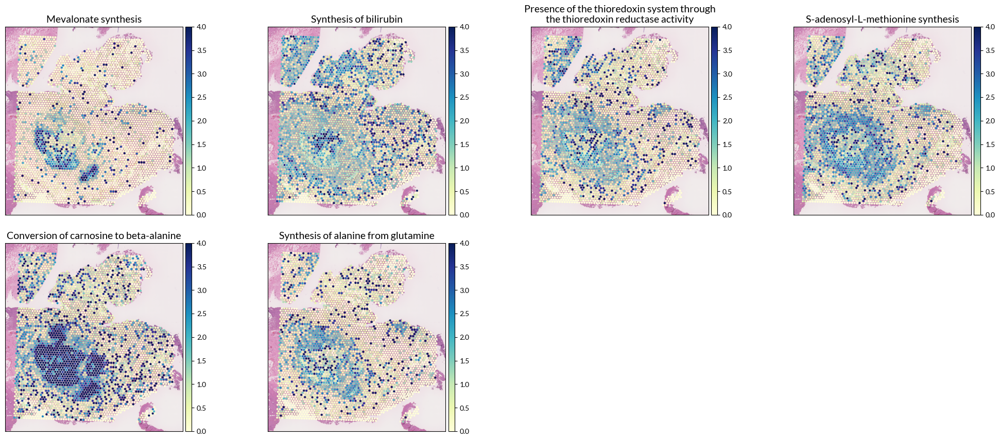

In [33]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,
                                            keys=list(set(marker_tasks)),
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.0001,
                                            vmin=0,
                                            vmax=4,
                                            wrapped_title_length=45,
                                            save='TFIDF-Markers'          
                                           )

## Visualize metabolic tasks of interest

In [34]:
spatial_samples = {'radius' : [500, 150], 'range' : [(400, 1000), (50, 450)]}

In [35]:
del bdata.varm['PCs']

In [36]:
adata_updated = sccellfie.preprocessing.adata_utils.transfer_variables(
    adata_target=bdata,
    adata_source=results['adata'].metabolic_tasks,
    var_names=results['adata'].metabolic_tasks.var_names,
#     var_names=['Synthesis of androstenedione from cholesterol', 'Synthesis of estrone (E1) from androstenedione',
#                'Synthesis of estradiol-17beta (E2) from androstenedione'
#               ]
)

In [37]:
r = sccellfie.spatial.compute_neighbor_distribution(
    adata_updated,
    radius_range=spatial_samples['range'][sample_idx],  # adjust based on your data's scale
    n_points=200,
    spatial_key='spatial'
)

(<Figure size 1500x800 with 4 Axes>, GridSpec(2, 3))

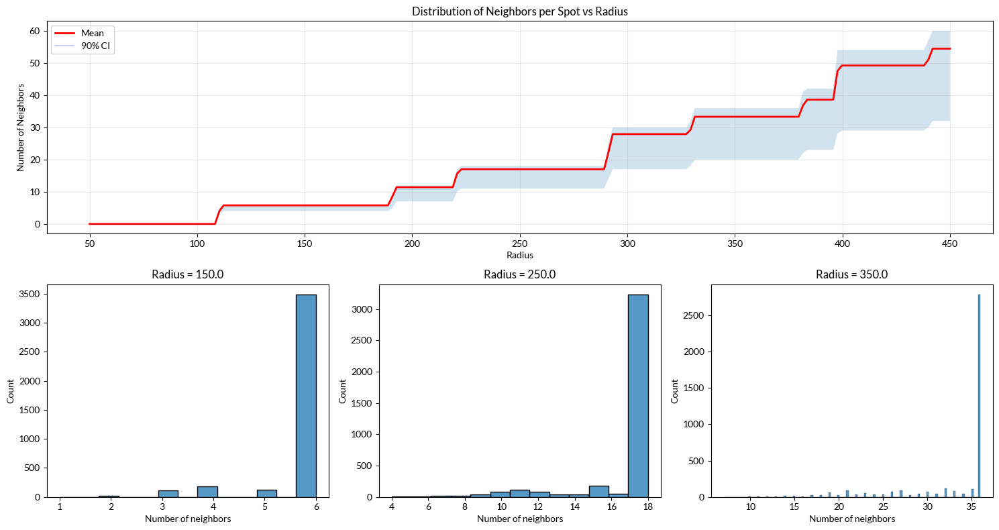

In [38]:
sccellfie.plotting.spatial.plot_neighbor_distribution(r, save='CCC-Radius')

In [39]:
radius = spatial_samples['radius'][sample_idx]

In [40]:
# Compute local colocalization scores
adata_updated.obs['E2^ESR1'] = sccellfie.communication.compute_local_colocalization_scores(
    adata_updated,
    var1='Synthesis of estradiol-17beta (E2) from androstenedione',
    var2='ESR1',
    neighbors_radius=radius,
    method='pairwise_concordance',
    min_neighbors=3,
    spatial_key='spatial',
    inplace=False
)

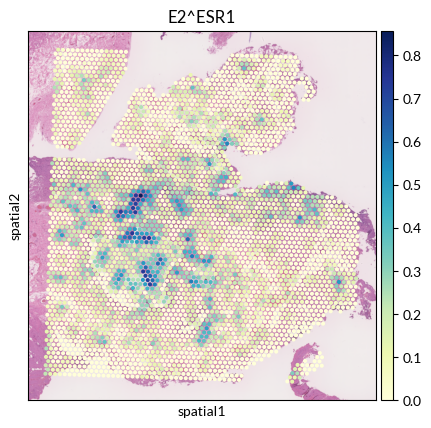

In [41]:
sc.pl.spatial(adata_updated, img_key="hires",
              color=['E2^ESR1'], size=SPOT_SIZE,
              cmap='YlGnBu', 
              save='Estrogen-Signaling'
             )

## Score major metabolic pathways with scanpy score

In [42]:
from tqdm import tqdm

In [43]:
def get_vmin(vals):
    abs_val = np.max(np.abs(vals))
    return -abs_val

def get_vmax(vals):
    abs_val = np.max(np.abs(vals))
    return abs_val

In [44]:
major_tasks = dict()
col_group = 'System'
for major, df in results['task_info'].groupby(col_group):
    tasks = [t for t in df['Task'].unique() if t in results['adata'].metabolic_tasks.var_names]
    if len(tasks) > 0:
        major = f'{col_group.upper()}: ' + major.upper()
        major_tasks[major.upper()] = tasks

In [45]:
for k, v in tqdm(major_tasks.items()):
    sc.tl.score_genes(results['adata'].metabolic_tasks, gene_list=v, score_name=k)

100%|██████████| 13/13 [00:00<00:00, 75.31it/s]


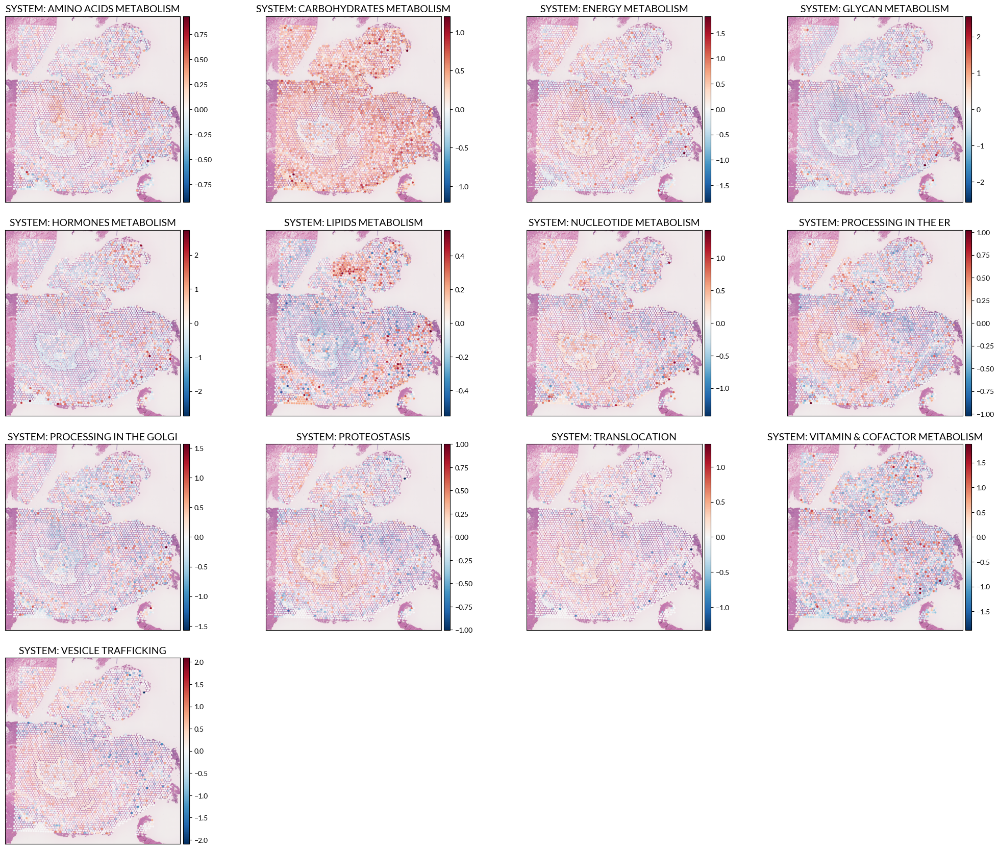

In [46]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,                                             
                                            keys=list(major_tasks.keys()),
                                            img_key="hires",
                                            cmap='RdBu_r',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.001,
                                            vmin=get_vmin,
                                            vmax=get_vmax,
                                            save='Major-Tasks')

In [47]:
tasks_of_interest = ['Synthesis of thromboxane from arachidonate',
                     'Synthesis of L-kynurenine from tryptophan',
                     #'Synthesis of N-formylanthranilate from tryptophan',
                     'Mevalonate synthesis',
                     'Glucose to lactate conversion',
                     'Gluconeogenesis from Lactate',
                     #'Synthesis of malonyl-coa',
                     #'Conversion of 1-phosphatidyl-1D-myo-inositol 4,5-bisphosphate to 1D-myo-inositol 1,4,5-trisphosphate',
                     'Synthesis of methylglyoxal',
                     #'SYSTEM: LIPIDS METABOLISM',
                    ]

tasks_of_interest = [s for s in tasks_of_interest if (s in results['adata'].metabolic_tasks.var_names) | (s in results['adata'].metabolic_tasks.obs.columns)]

In [48]:
[f for f in results['adata'].metabolic_tasks.var_names if 'fructose' in f.lower()]

['Fructose to glucose conversion (via fructose-6-phosphate)',
 'Mannose degradation (to fructose-6-phosphate)',
 'Synthesis of fructose-6-phosphate from erythrose-4-phosphate (HMP shunt)']

In [49]:
len(tasks_of_interest)

6

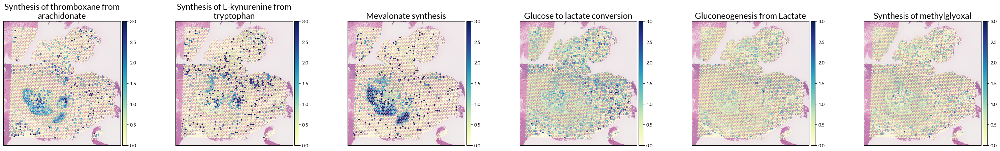

In [50]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,
                                            keys=tasks_of_interest, # + 
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=7,
                                            wspace=0.0001,
                                            vmin=0,
                                            vmax=3,
                                            wrapped_title_length=40,
                                            title_fontsize=18,
                                            #vmin=[0, 0, 0 ,0, get_vmin],
                                            #vmax=[3, 3, 3 ,3, get_vmax],
                                            #title=tasks_of_interest[:4] + ['Lipids Metabolism'],
                                            save='Endometriosis-Epi-Markers-V2'             
                                           )

## Spatial Metrics

### Generate spatial knn network

In [51]:
sccellfie.spatial.create_knn_network(results['adata'].metabolic_tasks, n_neighbors=10, spatial_key='spatial')

### Moran's I

In [52]:
import squidpy as sq

In [53]:
sq.gr.spatial_autocorr(
    results['adata'].metabolic_tasks,
    mode="moran",
    n_perms=1000,
    n_jobs=1,
)

  0%|          | 0/1000 [00:00<?, ?/s]

In [54]:
moran = results['adata'].metabolic_tasks.uns['moranI']

In [55]:
moran

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
Oxidative phosphorylation via NADH-coenzyme Q oxidoreductase (COMPLEX I),0.708710,0.000000,0.00009,0.000000,0.000999,0.000177,0.000000,0.000000,0.001028
Synthesis of inositol,0.613062,0.000000,0.00009,0.000000,0.000999,0.000168,0.000000,0.000000,0.001028
Glucuronate synthesis (via inositol),0.608653,0.000000,0.00009,0.000000,0.000999,0.000166,0.000000,0.000000,0.001028
Cardiolipin synthesis,0.583059,0.000000,0.00009,0.000000,0.000999,0.000158,0.000000,0.000000,0.001028
Triacylglycerol synthesis,0.579308,0.000000,0.00009,0.000000,0.000999,0.000151,0.000000,0.000000,0.001028
...,...,...,...,...,...,...,...,...,...
Inositol as input for glucuronate-xylulose pathway,0.026699,0.002247,0.00009,0.000256,0.001998,0.000059,0.002289,0.000261,0.002026
Malate to pyruvate conversion,0.026502,0.002397,0.00009,0.000284,0.001998,0.000058,0.002431,0.000288,0.002026
Tetrahydrofolate synthesis,0.024542,0.004474,0.00009,0.000334,0.002997,0.000053,0.004516,0.000337,0.003025
Conversion of estrone (E1) to estrone sulfate (E1S),0.021466,0.011020,0.00009,0.001125,0.003996,0.000051,0.011071,0.001130,0.004015


<Axes: >

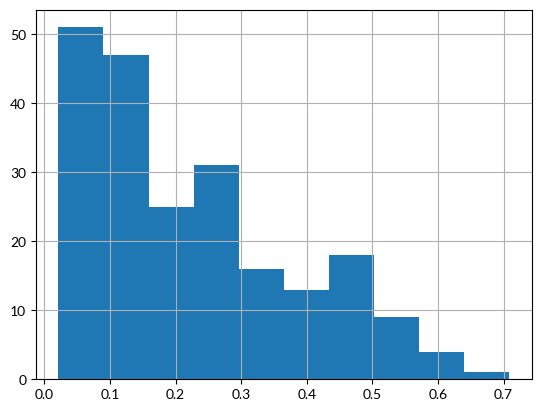

In [56]:
moran['I'].hist()

**Visualize spatially informative variables (High Moran's I coefficient)**

In [57]:
coef_threshold = 0.3

In [58]:
top_moran = moran[moran['I'].abs() >= coef_threshold].dropna().sort_values(by='I', ascending=False)

In [59]:
top_moran.head(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
Oxidative phosphorylation via NADH-coenzyme Q oxidoreductase (COMPLEX I),0.708710,0.0,0.00009,0.0,0.000999,0.000177,0.0,0.0,0.001028
Synthesis of inositol,0.613062,0.0,0.00009,0.0,0.000999,0.000168,0.0,0.0,0.001028
Glucuronate synthesis (via inositol),0.608653,0.0,0.00009,0.0,0.000999,0.000166,0.0,0.0,0.001028
Cardiolipin synthesis,0.583059,0.0,0.00009,0.0,0.000999,0.000158,0.0,0.0,0.001028
Triacylglycerol synthesis,0.579308,0.0,0.00009,0.0,0.000999,0.000151,0.0,0.0,0.001028
Phosphatidyl-inositol synthesis,0.550701,0.0,0.00009,0.0,0.000999,0.000144,0.0,0.0,0.001028
Co-translational translocation,0.550286,0.0,0.00009,0.0,0.000999,0.000140,0.0,0.0,0.001028
N-linked glycosylation,0.540753,0.0,0.00009,0.0,0.000999,0.000148,0.0,0.0,0.001028
Leucine degradation,0.525149,0.0,0.00009,0.0,0.000999,0.000153,0.0,0.0,0.001028
Lysine degradation,0.522810,0.0,0.00009,0.0,0.000999,0.000146,0.0,0.0,0.001028


In [60]:
spa_informative_var = list(top_moran.index)

In [61]:
mt_df = results['adata'].metabolic_tasks.to_df().max(axis=0)
spa_informative_var = list(mt_df[spa_informative_var][mt_df[spa_informative_var] > 5*np.log(2)].index)
spa_inf_titles = [t + " (Moran's I: {:.3f})".format(top_moran.loc[t, 'I']) for t in spa_informative_var]

In [62]:
len(spa_informative_var)

6

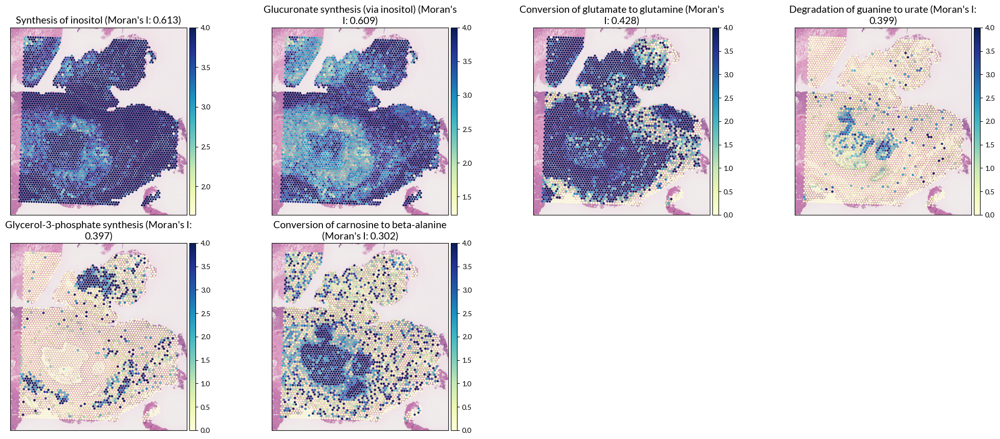

In [63]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,                                             
                                            keys=spa_informative_var,
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=4,
                                            wspace=0.001,
                                            vmax=4,
                                            title=spa_inf_titles,
                                            save='Moran_i',
                                           )

## Cell2location

In [64]:
comp = pd.read_csv('Peri&Deep_q05_cell_abundance_w_sf.csv', index_col=0)

In [65]:
comp.head()

,q05cell_abundance_w_sf_B_cell,q05cell_abundance_w_sf_Ciliated,q05cell_abundance_w_sf_Fibroblast_basalis,q05cell_abundance_w_sf_Glandular,q05cell_abundance_w_sf_Glandular_secretory,q05cell_abundance_w_sf_ILC3,q05cell_abundance_w_sf_Luminal,q05cell_abundance_w_sf_Mast_cell,q05cell_abundance_w_sf_Monocyte,q05cell_abundance_w_sf_Peripheral_lymphocyte,...,q05cell_abundance_w_sf_eStromal,q05cell_abundance_w_sf_eStromal_MMPs,q05cell_abundance_w_sf_pDC,q05cell_abundance_w_sf_preCiliated,q05cell_abundance_w_sf_preGlandular,q05cell_abundance_w_sf_preLuminal,q05cell_abundance_w_sf_uNK1,q05cell_abundance_w_sf_uNK2,q05cell_abundance_w_sf_uNK3,q05cell_abundance_w_sf_uSMCs
HCA_ENDO_sp13649806|AACACTTGGCAAGGAA-1,0.478021,0.009949,5.176869,0.009371,0.016969,0.258626,0.010649,0.437910,0.065656,0.090061,...,0.781472,0.390361,0.032146,0.012732,0.057286,0.042190,0.056637,0.065714,0.068609,3.689823
HCA_ENDO_sp13649806|AACAGGATTCATAGTT-1,0.021496,0.157926,0.066599,0.000089,0.000081,0.036775,0.001549,0.010491,0.015844,0.037152,...,0.127723,0.015605,0.003309,0.000545,0.000215,0.001473,0.002629,0.003059,0.003975,0.002031
HCA_ENDO_sp13649806|AACAGGCCAACGATTA-1,5.430159,0.036427,34.871429,0.215642,0.181314,4.265392,0.190535,5.891261,4.323140,3.167175,...,4.437658,3.569479,1.650495,0.084738,0.554575,0.353443,1.445331,1.458511,1.931056,20.635955
HCA_ENDO_sp13649806|AACAGGTTCACCGAAG-1,0.015554,0.032268,0.100719,0.000275,0.000047,0.019929,0.000397,0.012774,0.008803,0.016860,...,0.026975,0.009858,0.011434,0.001391,0.000456,0.000994,0.003674,0.002524,0.002524,0.012631
HCA_ENDO_sp13649806|AACAGTCCACGCGGTG-1,0.150427,0.106182,1.000541,0.000340,0.000084,0.079800,0.001372,0.038749,0.018251,0.049897,...,0.388976,0.071276,0.015901,0.009831,0.001462,0.002977,0.165811,0.049023,0.032383,0.033886


In [66]:
comp = comp.loc[[idx for idx in comp.index if sample in idx], :]
comp.index = [idx.split('|')[1] for idx in comp.index]

In [67]:
#comp.index = [idx.split('GRCh38-2020-A|')[1] for idx in comp.index]

In [68]:
comp.columns = [c.split('sf_')[1] for c in comp.columns]

In [69]:
comp.head()

,B_cell,Ciliated,Fibroblast_basalis,Glandular,Glandular_secretory,ILC3,Luminal,Mast_cell,Monocyte,Peripheral_lymphocyte,...,eStromal,eStromal_MMPs,pDC,preCiliated,preGlandular,preLuminal,uNK1,uNK2,uNK3,uSMCs
AACACGTGCATCGCAC-1,1.069240,0.007851,19.699711,0.021438,0.068923,0.517352,0.015287,0.887153,0.161025,0.160409,...,0.861606,1.076265,0.101291,0.009090,0.084911,0.038657,0.051750,0.179437,0.207727,0.013179
AACACTTGGCAAGGAA-1,0.461811,0.054435,6.029622,0.022074,0.057786,0.407644,0.017411,0.927186,0.262570,0.245049,...,0.240693,0.351023,0.098609,0.115120,0.017920,0.029729,0.084001,0.110037,0.136293,0.076819
AACAGGAAGAGCATAG-1,0.657792,0.025423,9.291611,0.041213,0.117460,0.513568,0.049973,1.100268,0.319063,0.405790,...,0.486573,0.539336,0.272750,0.035882,0.156502,0.077376,0.132576,0.135998,0.211406,6.002657
AACAGGATTCATAGTT-1,0.314642,0.095274,3.385309,0.031772,0.005639,0.225033,0.018906,0.352835,0.123115,0.188095,...,0.238419,0.163344,0.040324,0.142081,0.005220,0.026606,0.047172,0.056710,0.081690,0.085567
AACAGGTTATTGCACC-1,0.323601,0.034618,2.813215,0.006501,0.091822,0.302540,0.014765,0.238030,0.072464,0.175852,...,0.188847,0.209724,0.083767,0.055740,0.060238,0.022054,0.040585,0.048886,0.068029,0.951884


In [70]:
barcodes = adata_updated.obs.index.tolist()
adata_updated.obs = adata_updated.obs.join(comp.loc[barcodes, :])

In [71]:
adata_updated.obsm['cell2location'] = comp.loc[barcodes, :].copy()

In [72]:
macro = ['Conversion of 1-phosphatidyl-1D-myo-inositol 4,5-bisphosphate to 1D-myo-inositol 1,4,5-trisphosphate',
 'Conversion of glutamate to glutamine',
 'Gluconeogenesis from Glycerol',
]

In [73]:
cells = [None, 'preGlandular', 'Glandular', 'preLuminal', 'Luminal', 'eM1']

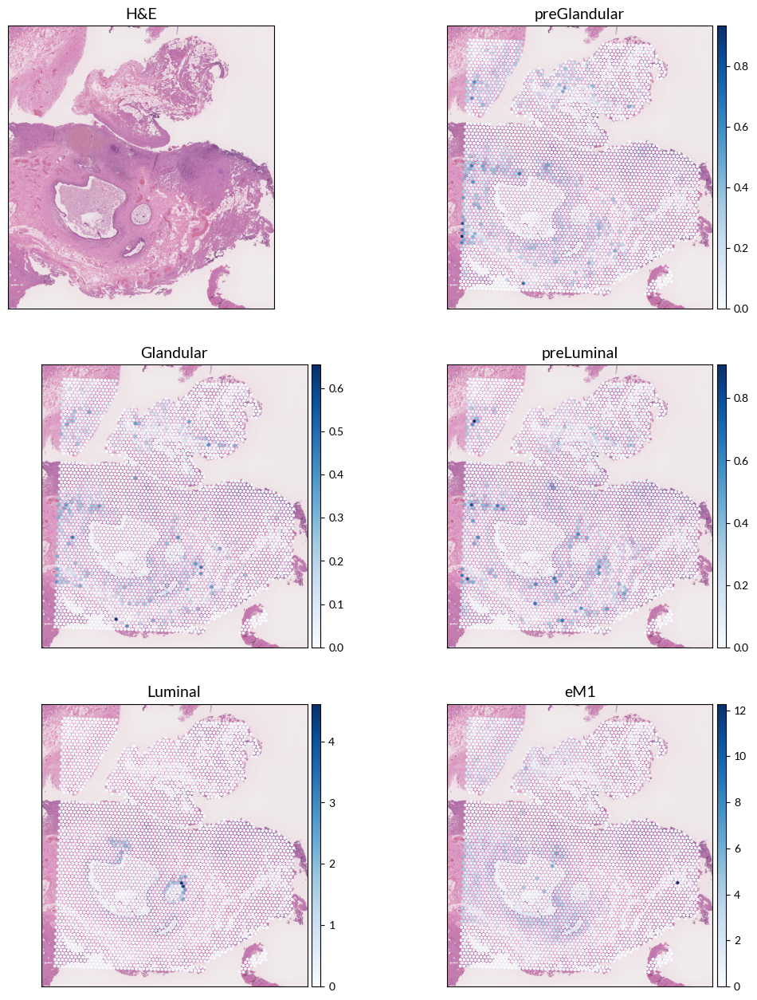

In [74]:
fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=cells, # + macro + genes2transfer, 'preLuminal', 'dStromal_late', 
                                            img_key="hires",
                                            cmap='Blues',#'YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=2,
                                            wspace=0.0001,
                                            hspace=0.2,
                                            vmin=0,
                                            wrapped_title_length=50,
                                            save='Endometriosis-CellComp'             
                                           )

In [75]:
import functools

def scale_by_percent(percent=0.8):
    def decorator(func):
        @functools.wraps(func)
        def wrapper(*args, **kwargs):
            # Get the original max value
            original_value = func(*args, **kwargs)
            # Return the scaled value
            return original_value * percent
        return wrapper
    return decorator

In [76]:
@scale_by_percent(1.0)
def get_vmax_spatial(vals):
    abs_val = np.max(np.abs(vals))
    return abs_val

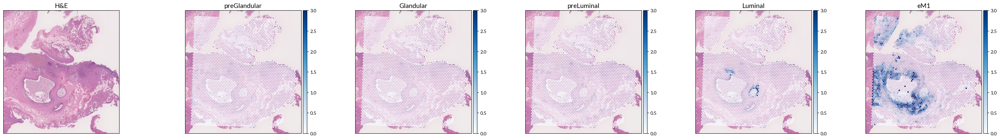

In [77]:
fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=cells, # + macro + genes2transfer, 'preLuminal', 'dStromal_late', 
                                            img_key="hires",
                                            cmap='Blues',#'YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=6,
                                            wspace=0.0001,
                                            hspace=0.2,
                                            vmin=0,
                                            vmax=[None] + [3.] * (len(cells)-1),
                                            #title=['H&E', 'M1', 'M2', 'Glandular', 'Luminal'],
                                            wrapped_title_length=50,
                                            save='Endometriosis-CellComp-V2'             
                                           )

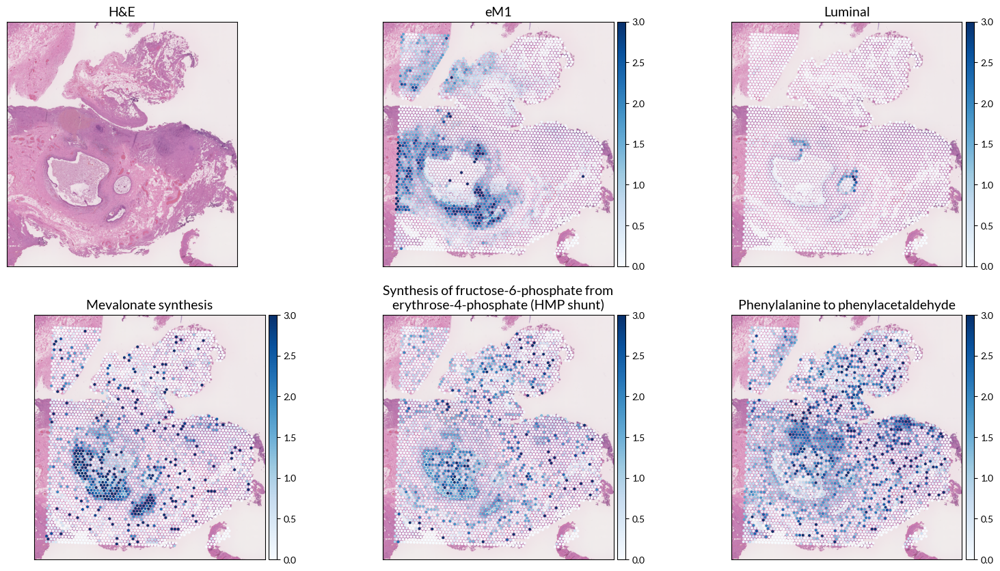

In [78]:
features = [None, 'eM1', 'Luminal',
            #'Synthesis of thromboxane from arachidonate',
            #'Synthesis of L-kynurenine from tryptophan',
            'Mevalonate synthesis',
#            'ATP generation from glucose (hypoxic conditions) - glycolysis',
            'Synthesis of fructose-6-phosphate from erythrose-4-phosphate (HMP shunt)',
            #'Serine synthesis',
            'Phenylalanine to phenylacetaldehyde',
           ]


fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=features, # + macro + genes2transfer, 'preLuminal', 'dStromal_late', 
                                            img_key="hires",
                                            cmap='Blues',#'YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            wspace=0.0001,
                                            hspace=0.2,
                                            vmin=0,
                                            vmax=[None] + [3.] * (len(features)-1),
                                            #title=['H&E', 'M1', 'M2', 'Glandular', 'Luminal'],
                                            wrapped_title_length=50,
                                            save='Endometriosis-CellComp-V3'             
                                           )

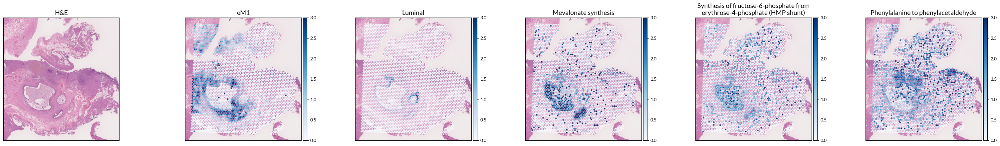

In [79]:
features = [None, 'eM1', 'Luminal',
            #'Synthesis of thromboxane from arachidonate',
            #'Synthesis of L-kynurenine from tryptophan',
            'Mevalonate synthesis',
#            'ATP generation from glucose (hypoxic conditions) - glycolysis',
            'Synthesis of fructose-6-phosphate from erythrose-4-phosphate (HMP shunt)',
            #'Serine synthesis',
            'Phenylalanine to phenylacetaldehyde',
           ]


fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=features, # + macro + genes2transfer, 'preLuminal', 'dStromal_late', 
                                            img_key="hires",
                                            cmap='Blues',#'YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=6,
                                            wspace=0.0001,
                                            hspace=0.2,
                                            vmin=0,
                                            vmax=[None] + [3.] * (len(features)-1),
                                            #title=['H&E', 'M1', 'M2', 'Glandular', 'Luminal'],
                                            wrapped_title_length=50,
                                            save='Endometriosis-CellComp-V4'             
                                           )